<a href="https://colab.research.google.com/github/WiratchawaKannika/API_LegalBERT-th/blob/main/py27_Load_Dataset_from_TCIA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd /content/drive/MyDrive/Prostate MRI Dataset

/content/drive/MyDrive/Prostate MRI Dataset


In [ ]:
import urllib2, urllib,sys
import pandas

In [ ]:
class TCIAClient:
    GET_IMAGE = "getImage"
    GET_MANUFACTURER_VALUES = "getManufacturerValues"
    GET_MODALITY_VALUES = "getModalityValues"
    GET_COLLECTION_VALUES = "getCollectionValues"
    GET_BODY_PART_VALUES = "getBodyPartValues"
    GET_PATIENT_STUDY = "getPatientStudy"
    GET_SERIES = "getSeries"
    GET_PATIENT = "getPatient"
    GET_SERIES_SIZE = "getSeriesSize"
    CONTENTS_BY_NAME = "ContentsByName"
    
    def __init__(self, apiKey , baseUrl, resource):
        self.apiKey = apiKey
        self.baseUrl = baseUrl + "/" + resource
        
    def execute(self, url, queryParameters={}):
        queryParameters = dict((k, v) for k, v in queryParameters.iteritems() if v)
        headers = {"api_key" : self.apiKey }
        queryString = "?%s" % urllib.urlencode(queryParameters)
        requestUrl = url + queryString
        request = urllib2.Request(url=requestUrl , headers=headers)
        resp = urllib2.urlopen(request)
        return resp
    
    def get_modality_values(self,collection = None , bodyPartExamined = None , modality = None , outputFormat = "json" ):
        serviceUrl = self.baseUrl + "/query/" + self.GET_MODALITY_VALUES
        queryParameters = {"Collection" : collection , "BodyPartExamined" : bodyPartExamined , "Modality" : modality , "format" : outputFormat }
        resp = self.execute(serviceUrl , queryParameters)
        return resp
    
    def get_series_size(self, SeriesInstanceUID = None, outputFormat = "json"):
        serviceUrl = self.baseUrl + "/query/" + self.GET_SERIES_SIZE
        queryParameters = {"SeriesInstanceUID" : SeriesInstanceUID, "format" :
                           outputFormat}
        resp = self.execute(serviceUrl, queryParameters)
        return resp

    def contents_by_name(self, name = None):
        serviceUrl = self.baseUrl + "/query/" + self.CONTENTS_BY_NAME
        queryParameters = {"name" : name}
        print serviceUrl
        resp = self.execute(serviceUrl,queryParameters)
        return resp

    def get_manufacturer_values(self,collection = None , bodyPartExamined = None, modality = None , outputFormat = "json"):
        serviceUrl = self.baseUrl + "/query/" + self.GET_MANUFACTURER_VALUES
        queryParameters = {"Collection" : collection , "BodyPartExamined" : bodyPartExamined , "Modality" : modality , "format" : outputFormat }
        resp = self.execute(serviceUrl , queryParameters)
        return resp
        
    def get_collection_values(self,outputFormat = "json" ):
        serviceUrl = self.baseUrl + "/query/" + self.GET_COLLECTION_VALUES
        queryParameters = { "format" : outputFormat }
        resp = self.execute(serviceUrl , queryParameters)
        return resp
        
    def get_body_part_values(self,collection = None , bodyPartExamined = None , modality = None , outputFormat = "json" ):
        serviceUrl = self.baseUrl + "/query/" + self.GET_BODY_PART_VALUES
        queryParameters = {"Collection" : collection , "BodyPartExamined" : bodyPartExamined , "Modality" : modality , "format" : outputFormat }
        resp = self.execute(serviceUrl , queryParameters)
        return resp
    
    def get_patient_study(self,collection = None , patientId = None , studyInstanceUid = None , outputFormat = "json" ):
        serviceUrl = self.baseUrl + "/query/" + self.GET_PATIENT_STUDY
        queryParameters = {"Collection" : collection , "PatientID" : patientId , "StudyInstanceUID" : studyInstanceUid , "format" : outputFormat }
        resp = self.execute(serviceUrl , queryParameters)
        return resp
    
    def get_series(self, collection = None , modality = None , studyInstanceUid = None , outputFormat = "json" ):
        serviceUrl = self.baseUrl + "/query/" + self.GET_SERIES
        queryParameters = {"Collection" : collection , "StudyInstanceUID" : studyInstanceUid , "Modality" : modality , "format" : outputFormat }
        resp = self.execute(serviceUrl , queryParameters)
        return resp
    
    def get_patient(self,collection = None , outputFormat = "json" ):
        serviceUrl = self.baseUrl + "/query/" + self.GET_PATIENT
        queryParameters = {"Collection" : collection , "format" : outputFormat }
        resp = self.execute(serviceUrl , queryParameters)
        return resp
    
    def get_image(self , seriesInstanceUid):
        serviceUrl = self.baseUrl + "/query/" + self.GET_IMAGE
        queryParameters = { "SeriesInstanceUID" : seriesInstanceUid }
        resp = self.execute( serviceUrl , queryParameters)
        return resp

In [ ]:
def printServerResponse(response):
    if response.getcode() == 200:
        print "Server Returned:\n"
        print response.read()
        print "\n"
    else:
        print "Error: " + str(response.getcode())

In [ ]:
def getResponseString(response):
    if response.getcode() is not 200:
        raise ValueError("Server returned an error")
    else:
        return response.read()

In [ ]:
tcia_client = TCIAClient(apiKey = "16ade9bc-f2fa-4a37-b357-36466a0020fc",baseUrl="https://services.cancerimagingarchive.net/services/v3",resource = "TCIA")

In [ ]:
response = tcia_client.get_collection_values()
strRespCollections = getResponseString(response)

pandas.io.json.read_json(strRespCollections)

,Collection
0,TCGA-GBM
1,LIDC-IDRI
2,BREAST-DIAGNOSIS
3,PROSTATE-MRI
4,PROSTATE-DIAGNOSIS
5,NaF PROSTATE
6,CT COLONOGRAPHY
7,REMBRANDT
8,RIDER Breast MRI
9,RIDER Lung CT


In [ ]:
#Check images in medical
modality = tcia_client.get_modality_values()
modalityCollections = getResponseString(modality) 

pandas.io.json.read_json(modalityCollections)

,Modality
0,MR
1,CT
2,DX
3,CR
4,PT
5,MG
6,RTDOSE
7,RTPLAN
8,RTSTRUCT
9,NM


In [ ]:
MR_Prostate = tcia_client.get_series(modality="MR", collection="PROSTATE-DIAGNOSIS")
MR_ProstateCollections = getResponseString(MR_Prostate) 

pdfSeries = pandas.io.json.read_json(MR_ProstateCollections)
pdfSeries

,BodyPartExamined,Collection,ImageCount,Manufacturer,ManufacturerModelName,Modality,ProtocolName,SeriesDate,SeriesDescription,SeriesInstanceUID,SeriesNumber,SoftwareVersions,StudyInstanceUID,Visibility
0,PROSTATE,PROSTATE-DIAGNOSIS,24,Philips Medical Systems,Achieva,MR,T2W_TSE_COR SENSE,2008-09-23,T2W_TSE_COR,1.3.6.1.4.1.14519.5.2.1.4792.2002.115178120278...,401,2.6.3,1.3.6.1.4.1.14519.5.2.1.4792.2002.269119633629...,1
1,PROSTATE,PROSTATE-DIAGNOSIS,36,Philips Medical Systems,Achieva,MR,T1W_TSE_AX CLEAR,2008-09-23,T1W_TSE_AX,1.3.6.1.4.1.14519.5.2.1.4792.2002.224141337920...,601,2.6.3,1.3.6.1.4.1.14519.5.2.1.4792.2002.269119633629...,1
2,PROSTATE,PROSTATE-DIAGNOSIS,32,Philips Medical Systems,Achieva,MR,T2W_TSE_AX SENSE,2008-09-23,T2W_TSE_AX,1.3.6.1.4.1.14519.5.2.1.4792.2002.150587400873...,501,2.6.3,1.3.6.1.4.1.14519.5.2.1.4792.2002.269119633629...,1
3,PROSTATE,PROSTATE-DIAGNOSIS,256,Philips Medical Systems,Achieva,MR,AX BLISS_GAD_8 SENSE,2008-09-23,AX BLISS_GAD_8,1.3.6.1.4.1.14519.5.2.1.4792.2002.327852935822...,701,2.6.3,1.3.6.1.4.1.14519.5.2.1.4792.2002.269119633629...,1
4,PROSTATE,PROSTATE-DIAGNOSIS,24,Philips Medical Systems,Achieva,MR,T2W_TSE_COR SENSE,2008-09-16,T2W_TSE_COR,1.3.6.1.4.1.14519.5.2.1.4792.2002.129052287184...,401,2.6.3,1.3.6.1.4.1.14519.5.2.1.4792.2002.186131127925...,1
5,PROSTATE,PROSTATE-DIAGNOSIS,256,Philips Medical Systems,Achieva,MR,AX BLISS_GAD_8 SENSE,2008-09-16,AX BLISS_GAD_8,1.3.6.1.4.1.14519.5.2.1.4792.2002.168327349550...,701,2.6.3,1.3.6.1.4.1.14519.5.2.1.4792.2002.186131127925...,1
6,PROSTATE,PROSTATE-DIAGNOSIS,36,Philips Medical Systems,Achieva,MR,T1W_TSE_AX CLEAR,2008-09-16,T1W_TSE_AX,1.3.6.1.4.1.14519.5.2.1.4792.2002.169750171117...,601,2.6.3,1.3.6.1.4.1.14519.5.2.1.4792.2002.186131127925...,1
7,PROSTATE,PROSTATE-DIAGNOSIS,32,Philips Medical Systems,Achieva,MR,T2W_TSE_AX SENSE,2008-09-16,T2W_TSE_AX,1.3.6.1.4.1.14519.5.2.1.4792.2002.877634419782...,501,2.6.3,1.3.6.1.4.1.14519.5.2.1.4792.2002.186131127925...,1
8,PROSTATE,PROSTATE-DIAGNOSIS,30,Philips Medical Systems,Achieva,MR,T2W_TSE_AX SENSE,2008-09-30,T2W_TSE_AX,1.3.6.1.4.1.14519.5.2.1.4792.2002.111471148954...,501,2.6.3,1.3.6.1.4.1.14519.5.2.1.4792.2002.265658077395...,1
9,PROSTATE,PROSTATE-DIAGNOSIS,240,Philips Medical Systems,Achieva,MR,AX BLISS_GAD_8 SENSE,2008-09-30,AX BLISS_GAD_8,1.3.6.1.4.1.14519.5.2.1.4792.2002.213214392796...,701,2.6.3,1.3.6.1.4.1.14519.5.2.1.4792.2002.265658077395...,1


>test load images

In [ ]:
strSeriesUID = pdfSeries.ix[0].SeriesInstanceUID
strSeriesUID

/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  """Entry point for launching an IPython kernel.


u'1.3.6.1.4.1.14519.5.2.1.4792.2002.115178120278427420002997506613'

In [ ]:
strSeriesUID = []

for i in range(len(pdfSeries)) :
    SeriesInstanceUID = pdfSeries['SeriesInstanceUID'][i]
    strSeriesUID.append(SeriesInstanceUID)

In [ ]:
print(len(strSeriesUID))
strSeriesUID

368


[u'1.3.6.1.4.1.14519.5.2.1.4792.2002.115178120278427420002997506613',
 u'1.3.6.1.4.1.14519.5.2.1.4792.2002.224141337920473944429470560700',
 u'1.3.6.1.4.1.14519.5.2.1.4792.2002.150587400873169762530193540778',
 u'1.3.6.1.4.1.14519.5.2.1.4792.2002.327852935822045047547732470371',
 u'1.3.6.1.4.1.14519.5.2.1.4792.2002.129052287184577280123708598707',
 u'1.3.6.1.4.1.14519.5.2.1.4792.2002.168327349550237726088452415939',
 u'1.3.6.1.4.1.14519.5.2.1.4792.2002.169750171117044167556076566095',
 u'1.3.6.1.4.1.14519.5.2.1.4792.2002.877634419782725079737441682068',
 u'1.3.6.1.4.1.14519.5.2.1.4792.2002.111471148954521988254022896085',
 u'1.3.6.1.4.1.14519.5.2.1.4792.2002.213214392796774544946089585754',
 u'1.3.6.1.4.1.14519.5.2.1.4792.2002.239745692969312974757081064337',
 u'1.3.6.1.4.1.14519.5.2.1.4792.2002.988405919353474569393217496529',
 u'1.3.6.1.4.1.14519.5.2.1.4792.2002.108702588243878463832442109552',
 u'1.3.6.1.4.1.14519.5.2.1.4792.2002.168654504429460124932218091301',
 u'1.3.6.1.4.1.14519

In [ ]:
#Test get size of series 
response_size = tcia_client.get_series_size(SeriesInstanceUID=strSeriesUID)
pandas.io.json.read_json(getResponseString(response_size))

,ObjectCount,TotalSizeInBytes
0,24,3229344


In [ ]:
response_image = tcia_client.get_image(strSeriesUID)
strResponseImage = getResponseString(response_image)

In [ ]:
strResponseImage

'PK\x03\x04\x14\x00\x08\x08\x08\x00c8\xf4R\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00./\x03\x00PK\x07\x08\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00PK\x03\x04\x14\x00\x08\x08\x08\x00c8\xf4R\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00./1-200.dcm\xc4\xbd\x07t\\\xd7u\xf7{\xc1\n\x12D\xaf\x04\x08p\xc0^AT\x82\x90(\x8a\x05\xec\x9d`\x95(\x8a\x14\x9b(\xb1\xf7*\xf6\xde\x1b\xd8{\xefET\xa1$\xcb\x92%[\xb6l\xcb-q\x8d[b;\x89\x1d;\xc5\xf1\xb3\xbf\x12\xe7\xfb\xff\x7f\xf7\x92v\x9c\x95\xbcd\xad\xf7\xd6\x87Y\x83\x99\xb9s\xe7\xdes\xf6\xdeg\xf7\xbdO\x10\xfc\xdf\xfd\xab\x1e\xd8gh\x1d\xbd\x8e\x19R/\xf8\x8c^\xeb\x04q\xc1\xf0\xde~\xd5_\\\x1d\xbd\x8e\x19\x98\x1b\x94\x14\x95\x16u+/.*)..\xeeVTQTRT\xae\xa7\xfe\xeb\xfb\xba:\xa3\xa7\xce(+\xea\xfa\xe8xyEI\x95\xce*\xf5\xe7\xca\xaa\xd2\xa2\xd2\xe2\xe2\xd2\xa2\xb2\xe2\xaa\xe2\xf2\x92\xaa\xe2\xd2\x8a\xb2\xaan\xe5e\xdd*+**\xba\x96V\x95t+-\xe9ZZQ\'H\xd1u2\xfe\xe4N\xfeT\xa2{\xa4\xe9\xbb\x14\xbe\xd3W\xfa\xb2\xccw\xd1\xf1\xf4\xa0f@

In [ ]:
type(strResponseImage)

str

In [ ]:
%cd /content/drive/MyDrive/Prostate MRI Dataset/TCIA

/content/drive/MyDrive/Prostate MRI Dataset/TCIA


In [ ]:
with open("images.zip","wb") as fid:
     fid.write(strResponseImage)
     fid.close()

In [ ]:
import zipfile
fid = zipfile.ZipFile("images.zip")
fid.extractall("images")
fid.close()

In [ ]:
def get_strimageTCIA(strSeriesUID) :
    strResponseImage_all = []
    response_image = tcia_client.get_image(strSeriesUID)
    response_image_all.append(response_image)
    strResponseImage = getResponseString(response_image)

In [ ]:
response_image_all = []

for i in strSeriesUID :
    response_image = tcia_client.get_image(i)
    response_image_all.append(response_image)

In [ ]:
response_image_all

In [ ]:
for i in response_image_all :
    strResponseImage = getResponseString(i)
    with open("images.zip","wb") as fid:
          fid.write(i)
          fid.close()

In [ ]:
import zipfile
import fileinput
import glob
import os

for name in strSeriesUID :
    zf = zipfile.ZipFile('%(name)s.zip' % {'name':name}, mode='w')
    try:
         zf.write('%(name)s' % {'name':name})
    finally:
        print('closing')
        zf.close()

In [ ]:
str_image_all = []

for i in response_image_all :
    strResponseImage = getResponseString(i)
    str_image_all.append(strResponseImage)

In [ ]:
str_image_all 

In [ ]:
type(response_image_all)

list

In [ ]:
for i in response_image_all :
    print(i)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
len(response_image_all)

1

In [ ]:
for i in response_image_all :
     with open("images.zip","wb") as fid:
          fid.write(i)
          fid.close()

In [ ]:
for i in response_image_all :
    str_img = i

In [ ]:
str_img

'PK\x03\x04\x14\x00\x08\x08\x08\x00w5\xf4R\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00./\x03\x00PK\x07\x08\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00PK\x03\x04\x14\x00\x08\x08\x08\x00w5\xf4R\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00./1-200.dcm\xc4\xbd\x07t\\\xd7u\xf7{\xc1\n\x12D\xaf\x04\x08p\xc0^AT\x82\x90(\x8a\x05\xec\x9d`\x95(\x8a\x14\x9b(\xb1\xf7*\xf6\xde\x1b\xd8{\xefET\xa1$\xcb\x92%[\xb6l\xcb-q\x8d[b;\x89\x1d;\xc5\xf1\xb3\xbf\x12\xe7\xfb\xff\x7f\xf7\x92v\x9c\x95\xbcd\xad\xf7\xd6\x87Y\x83\x99\xb9s\xe7\xdes\xf6\xdeg\xf7\xbdO\x10\xfc\xdf\xfd\xab\x1e\xd8gh\x1d\xbd\x8e\x19R/\xf8\x8c^\xeb\x04q\xc1\xf0\xde~\xd5_\\\x1d\xbd\x8e\x19\x98\x1b\x94\x14\x95\x16u+/.*)..\xeeVTQTRT\xae\xa7\xfe\xeb\xfb\xba:\xa3\xa7\xce(+\xea\xfa\xe8xyEI\x95\xce*\xf5\xe7\xca\xaa\xd2\xa2\xd2\xe2\xe2\xd2\xa2\xb2\xe2\xaa\xe2\xf2\x92\xaa\xe2\xd2\x8a\xb2\xaan\xe5e\xdd*+**\xba\x96V\x95t+-\xe9ZZQ\'H\xd1u2\xfe\xe4N\xfeT\xa2{\xa4\xe9\xbb\x14\xbe\xd3W\xfa\xb2\xccw\xd1\xf1\xf4\xa0f@

In [ ]:
for i in response_image_all :
    create_zip(i) 

In [ ]:
fid = zipfile.ZipFile("images.zip")
fid.extractall("images")
fid.close()

In [ ]:
response_image_all[0]

> Read dcm file

In [ ]:
!pip install pydicom

     |████████████████████████████████| 35.3MB 134kB/s 


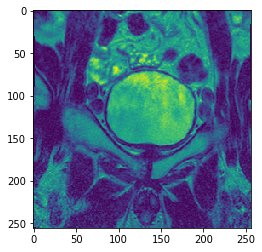

In [ ]:
import pydicom as dicom
import matplotlib.pylab as plt

# specify your image path
image_path = '/content/drive/MyDrive/Prostate MRI Dataset/images_TCIA/1-200.dcm'
ds = dicom.dcmread(image_path)

plt.imshow(ds.pixel_array)

> Convert dcm to jpg

In [ ]:
import cv2   

# specify your image path
image_path = '/content/drive/MyDrive/Prostate MRI Dataset/images_TCIA/1-200.dcm'
ds = dicom.dcmread(image_path)

pixel_array_numpy = ds.pixel_array

image_format = '.jpg' # or '.png'
image_path = image_path.replace('.dcm', image_format)

cv2.imwrite(image_path, pixel_array_numpy)

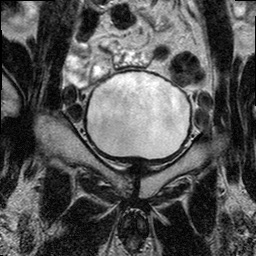

In [ ]:
import os 
from IPython.display import Image

Image(filename='/content/drive/MyDrive/Prostate MRI Dataset/images_TCIA/1-200.jpg',width=400)